In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [95]:
data = pd.read_csv('../data/data_global_clean.csv')

In [96]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11366 entries, 0 to 11365
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          11366 non-null  object 
 1   Email         11366 non-null  object 
 2   Name          11366 non-null  object 
 3   Position      11366 non-null  object 
 4   Seniority     11366 non-null  object 
 5   Location      11366 non-null  object 
 6   Studio        11366 non-null  object 
 7   Client        11366 non-null  object 
 8   Client Tag    11366 non-null  object 
 9   Project       11366 non-null  object 
 10  Project Tag   11366 non-null  object 
 11  Team Name     11366 non-null  object 
 12  Engagement    11366 non-null  float64
 13  Email Leader  10226 non-null  object 
 14  Year          11366 non-null  int64  
 15  Month         11366 non-null  int64  
 16  Day           11366 non-null  int64  
 17  DateDT        11366 non-null  object 
 18  ID            11366 non-nu

In [97]:
data['Engagement'].value_counts().sort_index()

Engagement
0.00    268
0.03     19
0.05     10
0.07      7
0.08      8
       ... 
4.96      7
4.97     18
4.98      5
4.99      4
5.00    243
Name: count, Length: 372, dtype: int64

In [98]:
data = data[[ 'Month', 'Day', 'Engagement', "ID" ]]

In [99]:
i = 0
# Múltiplos de n/10
n = 1

for value in data['Engagement']:
    if value < .1 * n and value > 0:
        data['Engagement'][i] = .1 * n
    else:
        data['Engagement'][i] = round(value / n, 1) * n
    i += 1

C:\Users\angel\AppData\Local\Temp\ipykernel_18480\2270717960.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['Engagement'][i] = round(value / n, 1) * n
C:\Users\angel\AppData\Local\Temp\ipykernel_18480\2270717960.py:9: FutureWarning

In [100]:
data['Engagement'].value_counts().shape

(48,)

In [101]:
data['Engagement'].value_counts().sort_index()

Engagement
0.0    268
0.1     76
0.2     55
0.3     61
0.4     41
0.5     40
0.6     34
0.7     50
0.8     21
0.9     18
1.0      3
1.1     12
1.5     23
1.6    102
1.7    116
1.8     43
1.9    114
2.0    233
2.1    195
2.2    358
2.3    189
2.4    485
2.5    511
2.6    476
2.7    564
2.8    452
2.9    520
3.0    632
3.1    510
3.2    529
3.3    491
3.4    564
3.5    545
3.6    442
3.7    346
3.8    315
3.9    333
4.0    267
4.1    212
4.2    203
4.3    137
4.4     95
4.5    115
4.6     90
4.7     65
4.8     62
4.9     68
5.0    285
Name: count, dtype: int64

In [102]:
data = data.sort_values(["ID", "Month", "Day"]).reset_index(drop=True)

In [103]:
data.head()
data.to_csv("../data/data_test.csv", index=False)

In [104]:
states = data["Engagement"].values

In [105]:
unique_states = np.sort(data["Engagement"].unique())
n_states = data['Engagement'].value_counts().shape[0]

In [106]:
# Mapeo de estados
state_to_idx = {state: i for i, state in enumerate(unique_states)}

In [107]:
# Initialize transition count matrix
transition_counts = np.zeros((n_states, n_states), dtype=int)

In [108]:
transition_counts

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(48, 48))

In [109]:
for i in range(len(states) - 1):
    if data["ID"].values[i] != data["ID"].values[i + 1]:
        continue  # Skip transitions between different IDs
    s_current = state_to_idx[states[i]]
    s_next = state_to_idx[states[i + 1]]
    transition_counts[s_current, s_next] += 1

In [110]:
transition_counts = transition_counts / transition_counts.sum(axis=1, keepdims=True)

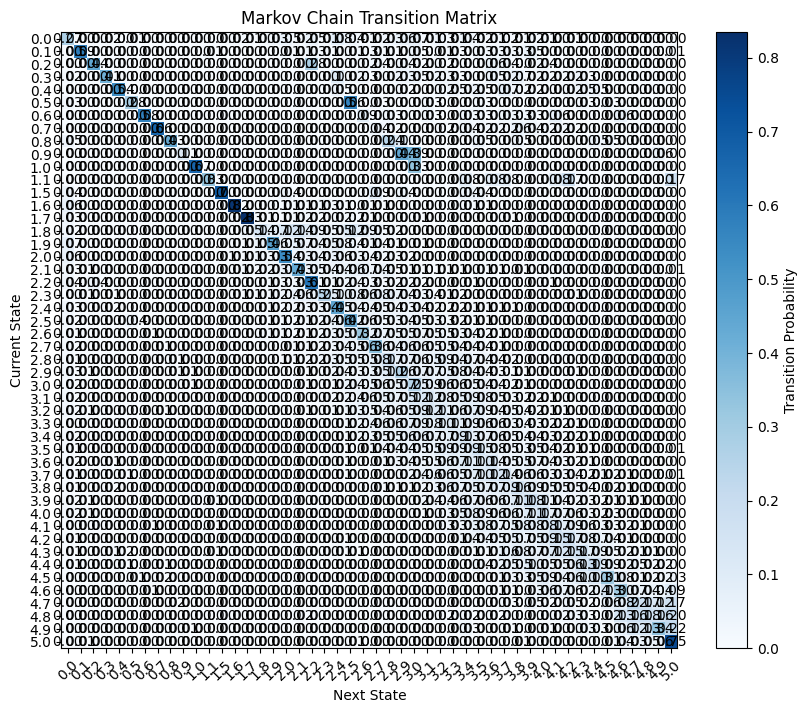

In [111]:
# Plot the transition matrix
plt.figure(figsize=(10, 8))
plt.imshow(transition_counts, cmap='Blues', interpolation='nearest')
plt.colorbar(label='Transition Probability')
plt.xticks(ticks=np.arange(n_states), labels=unique_states, rotation=45)
plt.yticks(ticks=np.arange(n_states), labels=unique_states)
plt.xlabel('Next State')
plt.ylabel('Current State')
plt.title('Markov Chain Transition Matrix')
# number labels
for i in range(n_states):
    for j in range(n_states):
        plt.text(j, i, f"{transition_counts[i, j]:.2f}", ha='center', va='center', color='black')
plt.show()

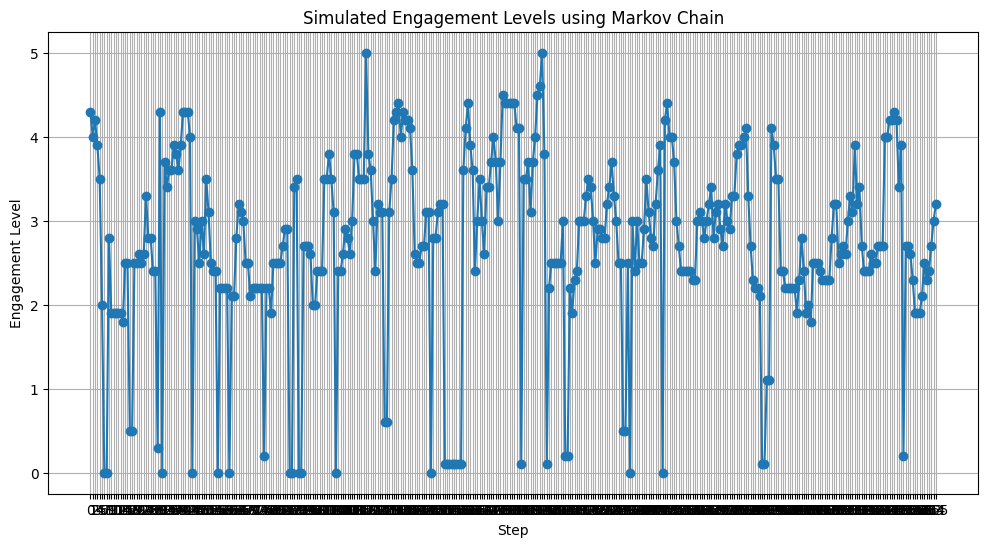

In [112]:
# Simulate the markov chain
n_steps = 365
current_state = np.random.choice(unique_states)
simulated_states = [current_state]
for _ in range(n_steps):
    current_idx = state_to_idx[current_state]
    next_state = np.random.choice(
        unique_states, p=transition_counts[current_idx])
    simulated_states.append(next_state)
    current_state = next_state

# Plot simulated states
plt.figure(figsize=(12, 6))
plt.plot(simulated_states, marker='o')
plt.xticks(ticks=np.arange(n_steps + 1))
plt.xlabel('Step')
plt.ylabel('Engagement Level')
plt.title('Simulated Engagement Levels using Markov Chain')
plt.grid()
plt.show()